In [26]:
import os
import sys
# sys.path.append('..')
import time
# from time import sleep
import numpy as np
import pandas as pd
import datetime
import missingno

from itertools import product

import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from binance import Client
from tqdm import tqdm
import scipy
from scipy.stats import skew, kurtosis, linregress
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering, DBSCAN
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AffinityPropagation
from kneed import KneeLocator
import yfinance as yf
import seaborn as sns

In [2]:
api_key = "NfZnQVcCv3X5z0FKpdjoS9J7lrFL3ShtqDhTpIsCFlZc4B6ekK88N0kOiazCTKFZ"
api_secret = "nV8jitkGhil57iyCZbffmVhrknoIoeVWkDJfWI8eHG1shIfUMoOidXj887KwbldC"
client = Client(api_key, api_secret)

In [3]:
pairs = ['BTCUSDT','ETHUSDT','BNBUSDT','XRPUSDT','ADAUSDT','SOLUSDT','LUNAUSDT','AVAXUSDT','DOTUSDT','MATICUSDT','NEARUSDT','LTCUSDT','ATOMUSDT',
        'UNIUSDT','LINKUSDT','TRXUSDT','BCHUSDT','FTTUSDT','ETCUSDT','XLMUSDT','VETUSDT','WAVESUSDT','MANAUSDT','HBARUSDT','FILUSDT','EGLDUSDT','SANDUSDT',
         'RUNEUSDT','THETAUSDT','AXSUSDT','XMRUSDT','FTMUSDT','XTZUSDT','AAVEUSDT','EOSUSDT','HNTUSDT','ZECUSDT','ZILUSDT'
         ]

In [4]:
client = Client(api_key, api_secret)
exchange_info = client.get_exchange_info()
df = pd.DataFrame(exchange_info['symbols'])
symbols = []
for index, data in df.iterrows():
    if data['isMarginTradingAllowed'] == True:
        symbols.append(data['symbol'])

In [5]:
def listToDataframe(dataUnprocess):
    data_df = pd.DataFrame(dataUnprocess)
    data_df = data_df.drop(columns=[i for i in range(6, 12)])
    data_df.columns = ['TimeStamp', 'Open', 'High', 'Low', 'Close', 'Volume']
    data_df['Datetime'] = data_df['TimeStamp'].apply(lambda x: datetime.datetime.fromtimestamp(x//1000).strftime("%Y-%m-%d %H:%M:%S"))
    data_df['Datetime'] = pd.to_datetime(data_df['Datetime']) - datetime.timedelta(hours=8) #轉為UTC+0的時區
    data_df['Date'] = data_df['Datetime'].apply(lambda x: str(x)[:10])
    data_df['Time'] = data_df['Datetime'].apply(lambda x: str(x)[11:])
    data_df['Time'] = data_df['Time'].apply(lambda x: str(x)[:5])
    data_df = data_df.set_index('Datetime')
    data_df = data_df.drop(columns=['TimeStamp', 'Date', 'Time'])
    data_df = data_df[['Open', 'High', 'Low', 'Close', 'Volume']]
    return data_df

'''Ref=
https://stackoverflow.com/questions/55549499/how-to-retrieve-a-list-of-all-market-pairs-like-eth-btc-using-binance-api
https://stackoverflow.com/questions/69300571/get-historical-klines-for-multiple-pair-combination-with-a-base-usdt
'''
def multiple_klines() -> dict:
    klines = {}
    # You don't need API key/secret for this type of requets
    client = Client(api_key, api_secret)
    # Extract trading pairs from exchange information
    exchange_info = client.get_exchange_info()
    symbols = [x['symbol'] for x in exchange_info['symbols']]
    # Filter list
    # selected_symbols = list(filter(lambda x: x.endswith(quote_currency), symbols))
    # Iterate over filtered list of trading pairs
    symbols = pairs

    for symbol in tqdm(symbols):
        kline = client.get_historical_klines(
            symbol, client.KLINE_INTERVAL_1DAY,
            "4 Nov, 2020"
        )
        if kline:
            temp_data_df = listToDataframe(kline)
            klines[symbol] = temp_data_df

        # Prevent exceeding rate limit:
        if int(client.response.headers['x-mbx-used-weight-1m']) > 1_000:
            print('Pausing for 30 seconds...')
            time.sleep(30)

    return klines

In [50]:
klines_dict = multiple_klines()
df = pd.concat({k: v for k, v in klines_dict.items()})

100%|██████████| 38/38 [00:05<00:00,  6.66it/s]


##  Exploratory Data Analysis (EDA)

1. Descriptive Statistics
2. Outlier Treatment
3. Grouping of Data
4. Handling missing values in dataset
5. Correlation

Clean Data


In [51]:
df.reset_index(inplace = True)
df.rename(columns={'level_0': 'symbol'},inplace = True)
df = df.pivot(index='Datetime', columns='symbol', values = 'Close')
# df.dropna(inplace=True)
df = df.astype(float)
df.head()

symbol,AAVEUSDT,ADAUSDT,ATOMUSDT,AVAXUSDT,AXSUSDT,BCHUSDT,BNBUSDT,BTCUSDT,DOTUSDT,EGLDUSDT,...,TRXUSDT,UNIUSDT,VETUSDT,WAVESUSDT,XLMUSDT,XMRUSDT,XRPUSDT,XTZUSDT,ZECUSDT,ZILUSDT
Datetime,,,,,,,,,,,,,,,,,,,,,
2020-11-04,27.686,0.09550,4.387,3.1718,0.14583,241.14,26.9600,14144.01,4.0969,7.168,...,0.02420,1.9281,0.009398,3.1986,0.07456,115.67,0.23758,1.8759,54.09,0.01753
2020-11-05,30.995,0.09752,4.504,3.3348,0.13450,249.53,27.6875,15590.02,4.2229,7.387,...,0.02493,2.1901,0.009721,3.4277,0.08039,119.56,0.24561,1.8830,56.69,0.01886
2020-11-06,38.650,0.10910,4.880,3.5913,0.14400,257.79,29.0435,15579.92,4.5826,8.385,...,0.02616,2.5657,0.011196,3.5691,0.08388,119.37,0.25863,2.0889,61.57,0.02053
2020-11-07,44.529,0.10128,4.619,3.4126,0.14076,253.91,27.7651,14818.30,4.2341,7.858,...,0.02486,2.4755,0.010383,3.4434,0.07952,110.96,0.24910,2.0186,57.40,0.01852
2020-11-08,53.931,0.10655,4.809,3.4754,0.19846,270.80,28.4101,15475.10,4.3736,8.339,...,0.02535,2.8653,0.011122,3.5186,0.08150,120.33,0.25374,2.0869,60.61,0.01930


<AxesSubplot:>

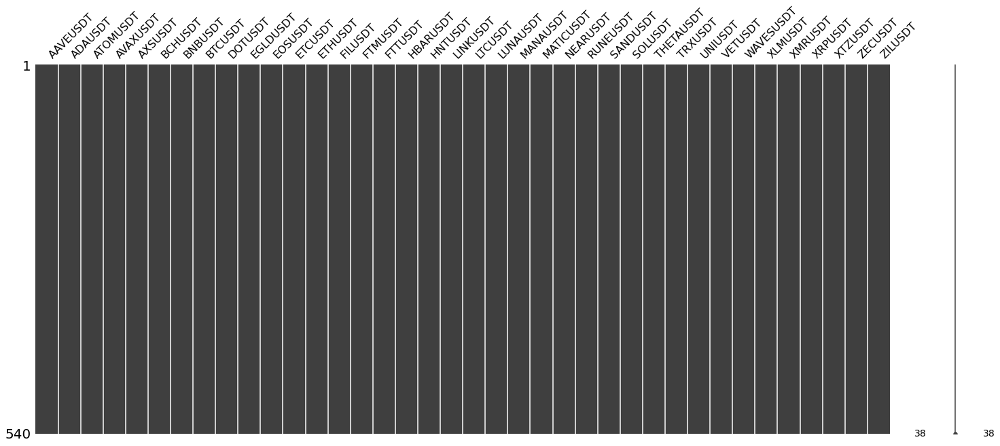

In [52]:
missingno.matrix(df)

In [54]:
'''
如果中位數(50%) != 平均(mean) 意味有
'''
df.describe(include='all')

symbol,AAVEUSDT,ADAUSDT,ATOMUSDT,AVAXUSDT,AXSUSDT,BCHUSDT,BNBUSDT,BTCUSDT,DOTUSDT,EGLDUSDT,...,TRXUSDT,UNIUSDT,VETUSDT,WAVESUSDT,XLMUSDT,XMRUSDT,XRPUSDT,XTZUSDT,ZECUSDT,ZILUSDT
count,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,...,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000
mean,264.992993,1.254724,21.274320,46.383797,43.670793,512.520315,348.478879,43112.691926,24.579123,152.063085,...,0.071178,18.832633,0.084110,16.975773,0.306537,224.121685,0.796109,4.069640,139.317667,0.094135
std,120.034360,0.667500,10.350035,34.658228,45.127041,206.429218,178.986948,11835.876642,11.604850,89.818392,...,0.029132,9.732461,0.049401,8.827518,0.120887,67.116897,0.322325,1.467493,50.559234,0.047763
min,27.686000,0.095500,4.387000,2.902600,0.134500,240.430000,26.960000,14144.010000,4.096900,7.168000,...,0.024200,1.928100,0.009398,3.198600,0.074560,110.960000,0.211380,1.819000,54.090000,0.017530
25%,166.775000,0.913748,12.289500,13.470375,3.782477,345.225000,264.036225,36686.497500,17.096775,87.766000,...,0.055180,10.327500,0.050570,9.895000,0.210625,175.150000,0.576840,2.964000,106.345000,0.062067
50%,274.200000,1.224400,21.819000,36.700000,42.359350,496.500000,384.450000,43083.300000,23.212000,148.860000,...,0.066360,19.482000,0.079595,15.230900,0.289050,221.590000,0.775900,3.737750,137.245000,0.087075
75%,358.536750,1.584925,28.997500,76.402500,69.392500,612.050000,473.050000,50719.952500,33.880500,197.875000,...,0.091450,25.902500,0.114808,23.362500,0.377323,262.977500,1.035525,5.093500,161.705000,0.111903
max,628.750000,2.966000,44.270000,134.840000,160.380000,1547.510000,676.150000,67525.830000,53.820000,490.990000,...,0.164210,43.108000,0.253321,54.450000,0.734650,484.000000,1.834680,8.711000,320.010000,0.236570


C:\Kit\Python\Envs\TMBA\lib\site-packages\seaborn\axisgrid.py:2071: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


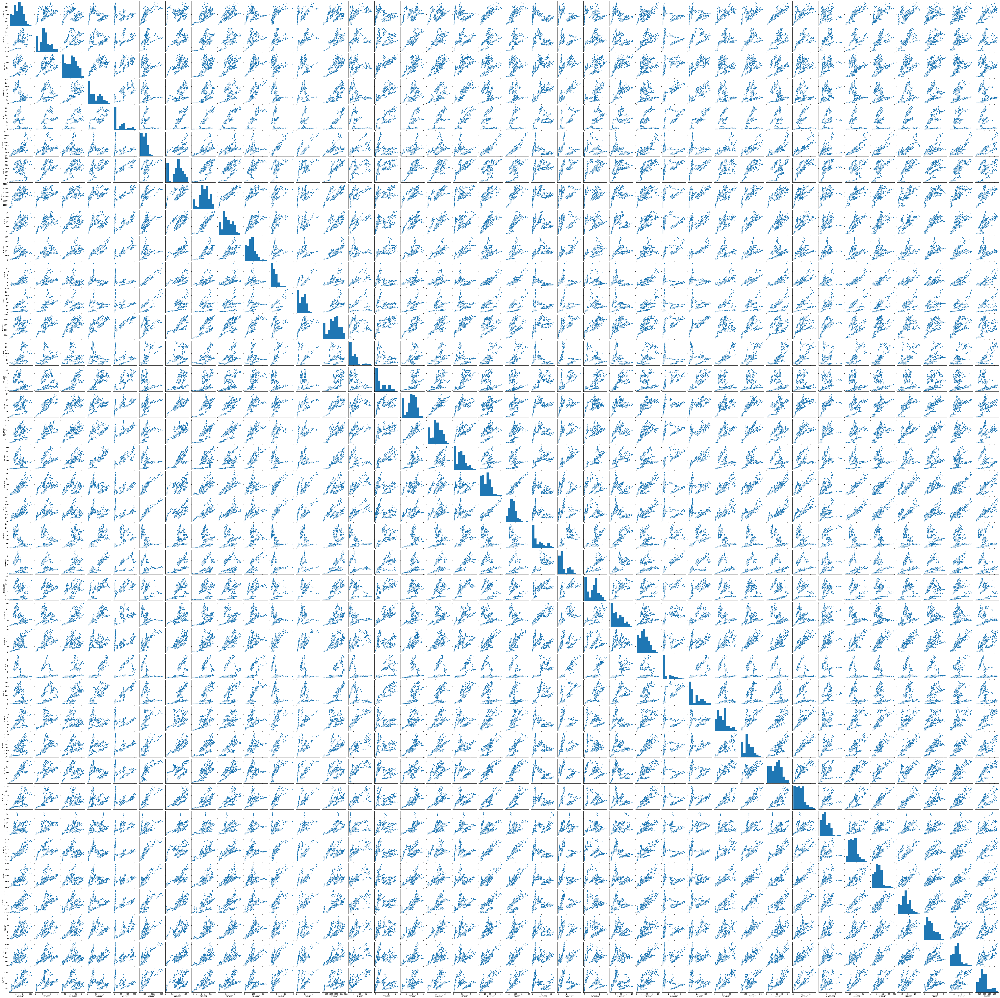

In [62]:
sns.pairplot(df);

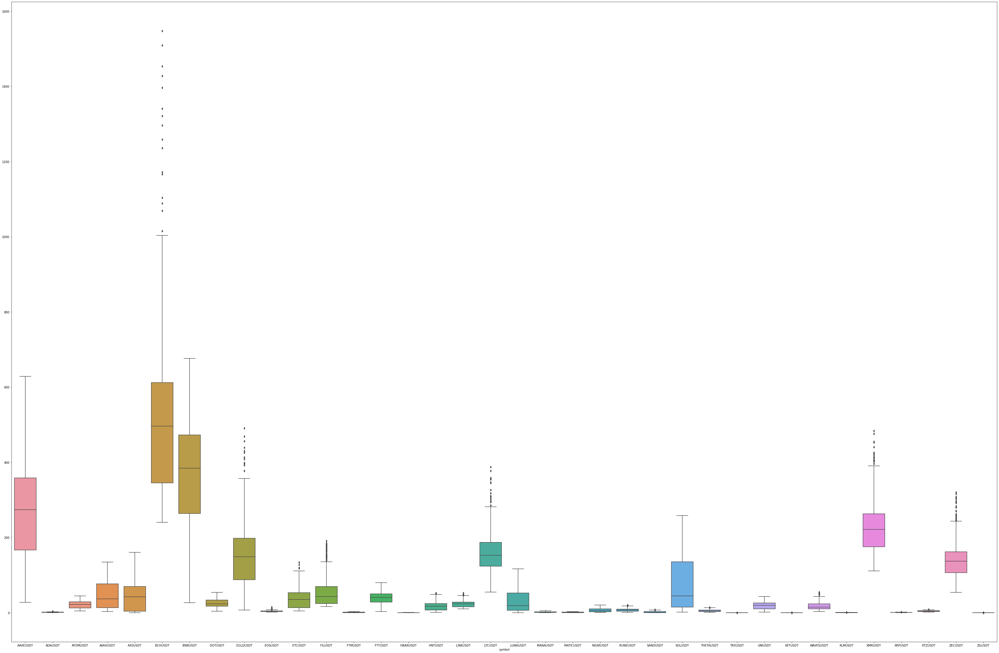

In [64]:
plt.figure(figsize=(60,40))
sns.boxplot(data=df.loc[:, ~df.columns.isin(['BTCUSDT','ETHUSDT'])])
plt.show()

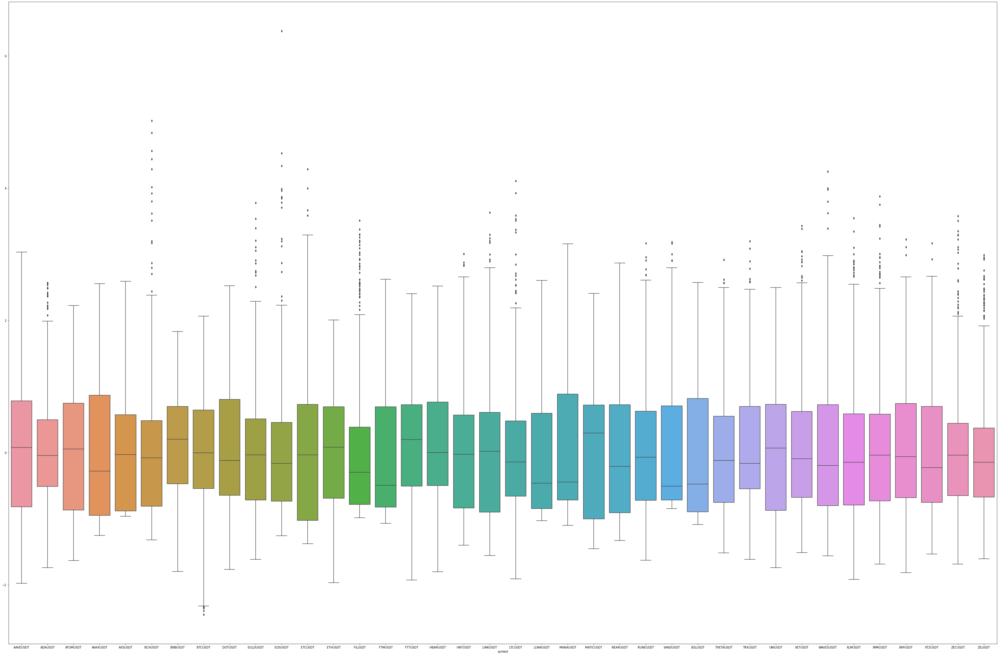

In [66]:
plt.figure(figsize=(60,40))
sns.boxplot(data=df.astype(float).apply(scipy.stats.zscore))
plt.show()

NameError: name 'ab' is not defined

## Data Preparation: past momentum & rankin

In [243]:
for column in df.columns:
    df[column] = df[column].astype(float)

In [244]:
#Calculate returns and create a data frame
returns = df.pct_change().mean()*266
returns = pd.DataFrame(returns)
returns.columns = ['returns']
#Calculate the volatility
returns['volatility'] = df.pct_change().std()*np.sqrt(266)

returns

,returns,volatility
symbol,,
AAVEUSDT,1.792191,1.224444
ADAUSDT,1.854542,1.073667
ATOMUSDT,1.779089,1.268667
AVAXUSDT,2.712745,1.416045
AXSUSDT,4.642784,1.812452
BCHUSDT,0.776146,1.062350
BNBUSDT,2.030669,1.126908
BTCUSDT,0.830147,0.664658
DOTUSDT,1.546695,1.181332


In [245]:
#Prepare the scaler
scale = StandardScaler().fit(returns)

#Fit the scaler
scaled_data = pd.DataFrame(scale.fit_transform(returns),columns = returns.columns, index = returns.index)
X = scaled_data
X.head()

,returns,volatility
symbol,,
AAVEUSDT,-0.234758,-0.162044
ADAUSDT,-0.174742,-0.748388
ATOMUSDT,-0.247369,0.009930
AVAXUSDT,0.651323,0.583057
AXSUSDT,2.509085,2.124612


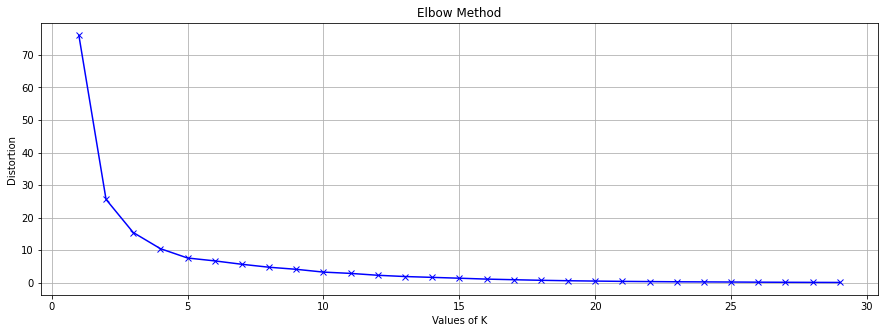

In [246]:
K = range(1,30)
distortions = []
for k in K:
    kmeans = KMeans(n_clusters = k)
    kmeans.fit(X)
    distortions.append(kmeans.inertia_)

#Plot the results
fig = plt.figure(figsize= (15,5))
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('Elbow Method')
plt.grid(True)
plt.show()

In [249]:
kl = KneeLocator(K, distortions, curve="convex", direction="decreasing")
kl.elbow

5

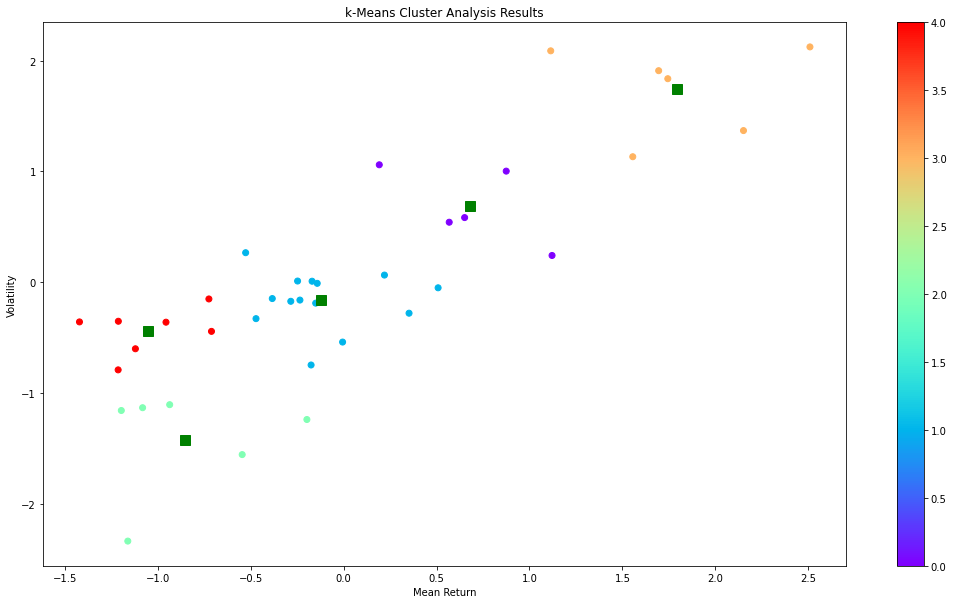

In [250]:
c = 5
#Fit the model
k_means = KMeans(n_clusters=c)
k_means.fit(X)
prediction = k_means.predict(X)

#Plot the results
centroids = k_means.cluster_centers_
fig = plt.figure(figsize = (18,10))
ax = fig.add_subplot(111)
scatter = ax.scatter(X.iloc[:,0],X.iloc[:,1], c=k_means.labels_, cmap="rainbow", label = X.index)
ax.set_title('k-Means Cluster Analysis Results')
ax.set_xlabel('Mean Return')
ax.set_ylabel('Volatility')
plt.colorbar(scatter)
plt.plot(centroids[:,0],centroids[:,1],'sg',markersize=10)
plt.show()

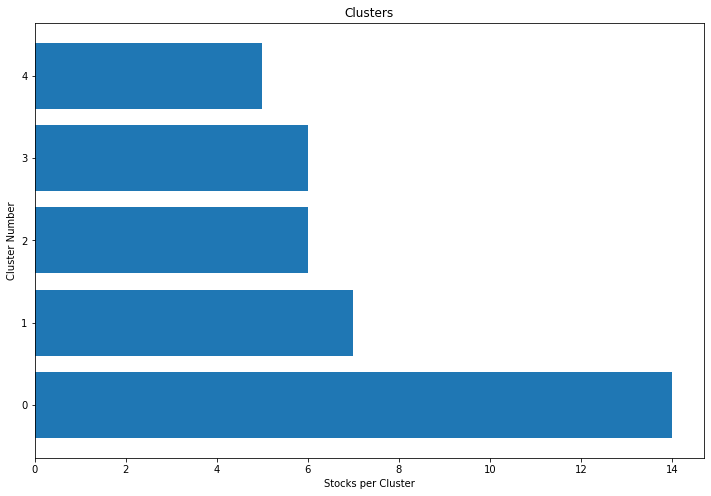

In [251]:
clustered_series = pd.Series(index=X.index, data=k_means.labels_.flatten())
clustered_series_all = pd.Series(index=X.index, data=k_means.labels_.flatten())
clustered_series = clustered_series[clustered_series != -1]
plt.figure(figsize=(12,8))
plt.barh(range(len(clustered_series.value_counts())),clustered_series.value_counts())
plt.title('Clusters')
plt.xlabel('Stocks per Cluster')
plt.ylabel('Cluster Number')
plt.show()

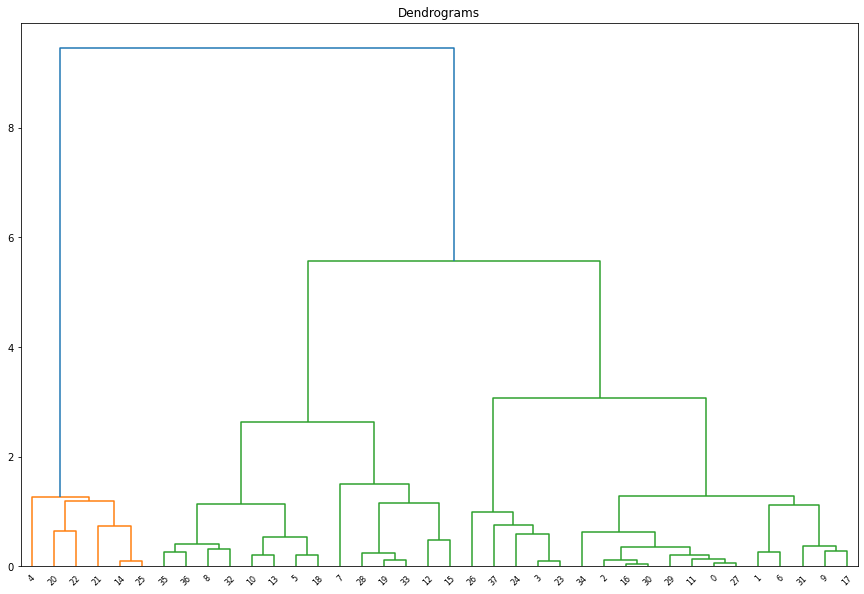

In [252]:
plt.figure(figsize=(15, 10))
plt.title("Dendrograms")
dend = shc.dendrogram(shc.linkage(X, method='ward'))

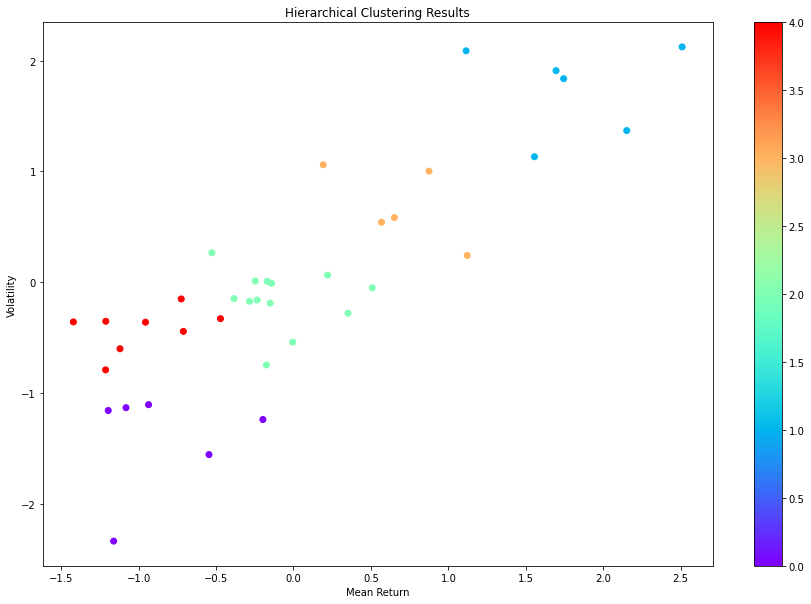

In [255]:
#Fit the model
clusters = 5
hc = AgglomerativeClustering(n_clusters= clusters, affinity='euclidean', linkage='ward')
labels = hc.fit_predict(X)

#Plot the results
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111)
scatter = ax.scatter(X.iloc[:,0], X.iloc[:,1], c=labels, cmap='rainbow')
ax.set_title('Hierarchical Clustering Results')
ax.set_xlabel('Mean Return')
ax.set_ylabel('Volatility')
plt.colorbar(scatter)
plt.show()

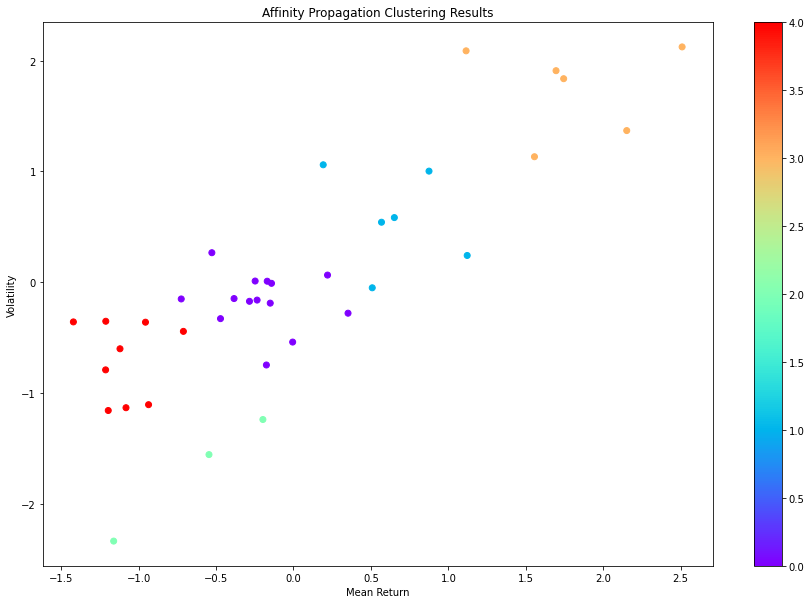

In [257]:
#Fit the model
ap = AffinityPropagation()
ap.fit(X)
labels1 = ap.predict(X)

#Plot the results
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111)
scatter = ax.scatter(X.iloc[:,0], X.iloc[:,1], c=labels1, cmap='rainbow')
ax.set_title('Affinity Propagation Clustering Results')
ax.set_xlabel('Mean Return')
ax.set_ylabel('Volatility')
plt.colorbar(scatter)
plt.show()

The number of clusters is: 5


<Figure size 432x288 with 0 Axes>

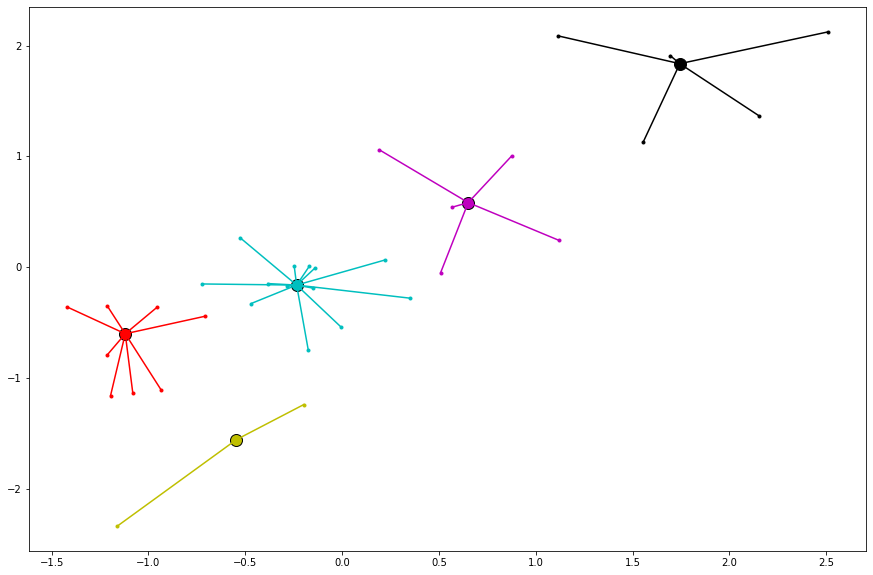

In [258]:
from itertools import cycle

#Extract the cluster centers and labels
cci = ap.cluster_centers_indices_
labels2 = ap.labels_

#Print their number
clusters = len(cci)
print('The number of clusters is:',clusters)

#Plot the results
X_ap = np.asarray(X)
plt.close('all')
plt.figure(1)
plt.clf
fig=plt.figure(figsize=(15,10))
colors = cycle('cmykrgbcmykrgbcmykrgbcmykrgb')
for k, col in zip(range(clusters),colors):
    cluster_members = labels2 == k
    cluster_center = X_ap[cci[k]]
    plt.plot(X_ap[cluster_members, 0], X_ap[cluster_members, 1], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col, markeredgecolor='k', markersize=12)
    for x in X_ap[cluster_members]:
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], col)

plt.show()

In [2]:
import hdbscan
from sklearn.datasets import make_blobs

data, _ = make_blobs(1000)

clusterer = hdbscan.HDBSCAN(min_cluster_size=10)
cluster_labels = clusterer.fit_predict(data)

ModuleNotFoundError: No module named 'hdbscan'

In [259]:
print("k-Means Clustering", metrics.silhouette_score(X, k_means.labels_, metric='euclidean'))
print("Hierarchical Clustering", metrics.silhouette_score(X, hc.fit_predict(X), metric='euclidean'))
print("Affinity Propagation Clustering", metrics.silhouette_score(X, ap.labels_, metric='euclidean'))

k-Means Clustering 0.42683314329670247
Hierarchical Clustering 0.4089801675682624
Affinity Propagation Clustering 0.4414697830077734


In [264]:
cluster_size_limit = 30
counts = clustered_series.value_counts()
ticker_count = counts[(counts>1) & (counts<=cluster_size_limit)]
print ("Number of clusters: %d" % len(ticker_count))
print ("Number of Pairs: %d" % (ticker_count*(ticker_count-1)).sum())

Number of clusters: 5
Number of Pairs: 304


In [268]:
def find_cointegrated_pairs(data, significance=0.05):
    n = data.shape[1]
    score_matrix = np.zeros((n, n))
    pvalue_matrix = np.ones((n, n))
    keys = data.keys()
    pairs = []
    for i in range(1):
        for j in range(i+1, n):
            S1 = data[keys[i]]
            S2 = data[keys[j]]
            result = coint(S1, S2)
            score = result[0]
            pvalue = result[1]
            score_matrix[i, j] = score
            pvalue_matrix[i, j] = pvalue
            if pvalue < significance:
                pairs.append((keys[i], keys[j]))
    return score_matrix, pvalue_matrix, pairs

In [272]:
from statsmodels.tsa.stattools import coint

cluster_dict = {}

for i, clust in enumerate(ticker_count.index):
    tickers = clustered_series[clustered_series == clust].index
    score_matrix, pvalue_matrix, pairs = find_cointegrated_pairs(df[tickers])
    cluster_dict[clust] = {}
    cluster_dict[clust]['score_matrix'] = score_matrix
    cluster_dict[clust]['pvalue_matrix'] = pvalue_matrix
    cluster_dict[clust]['pairs'] = pairs

pairs = []
for cluster in cluster_dict.keys():
    pairs.extend(cluster_dict[cluster]['pairs'])

print ("Number of pairs:", len(pairs))
print ("In those pairs, we found %d unique tickers." % len(np.unique(pairs)))
print(pairs)

Number of pairs: 5
In those pairs, we found 8 unique tickers.
[('AAVEUSDT', 'THETAUSDT'), ('AAVEUSDT', 'UNIUSDT'), ('BCHUSDT', 'EOSUSDT'), ('BCHUSDT', 'FILUSDT'), ('AVAXUSDT', 'NEARUSDT')]


In [273]:
from sklearn.manifold import TSNE
import matplotlib.cm as cm

stocks = np.unique(pairs)
X_data = pd.DataFrame(index=X.index, data=X).T
in_pairs_series = clustered_series.loc[stocks]
stocks = list(np.unique(pairs))
X_pairs = X_data.T.loc[stocks]
X_pairs.head()

,returns,volatility
symbol,,
AAVEUSDT,-0.234758,-0.162044
AVAXUSDT,0.651323,0.583057
BCHUSDT,-1.212754,-0.792398
EOSUSDT,-1.211651,-0.353358
FILUSDT,-1.420793,-0.359216


In [274]:
X_tsne = TSNE(learning_rate=30, perplexity=5, random_state=42, n_jobs=-1).fit_transform(X_pairs)
X_tsne

C:\Kit\Python\Envs\TMBA\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


array([[ -6.0501795,   5.6826916],
       [-44.330647 ,  -5.9412885],
       [ 52.866657 , -24.966688 ],
       [ 54.199387 ,   6.0352855],
       [ 77.147675 ,  -8.930892 ],
       [-31.61339  , -28.734138 ],
       [  9.71591  , -16.140709 ],
       [ 19.167196 ,   9.472511 ]], dtype=float32)

C:\Kit\Python\Envs\TMBA\lib\site-packages\ipykernel_launcher.py:11: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-" (-> color='k'). The keyword argument will take precedence.
  # This is added back by InteractiveShellApp.init_path()


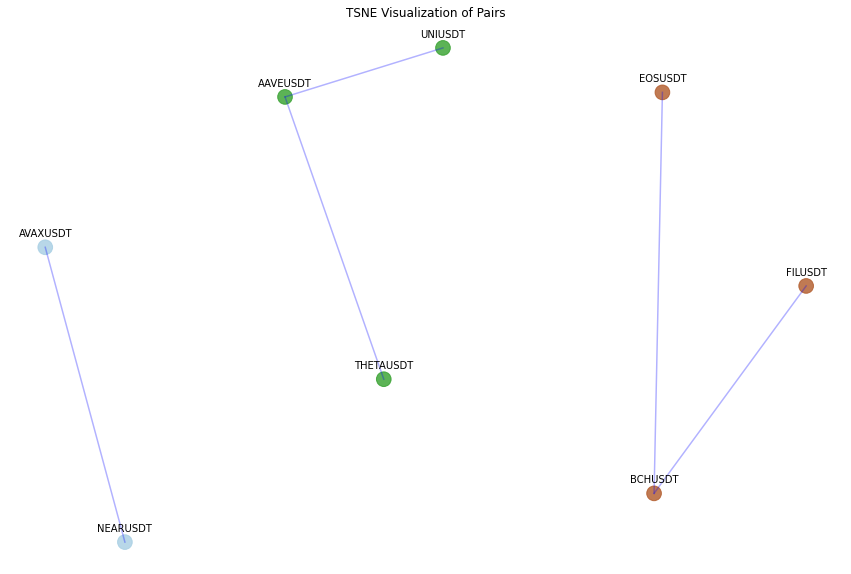

In [275]:
plt.figure(1, facecolor='white',figsize=(15,10))
plt.clf()
plt.axis('off')
for pair in pairs:
    ticker1 = pair[0]
    loc1 = X_pairs.index.get_loc(pair[0])
    x1, y1 = X_tsne[loc1, :]
    ticker2 = pair[0]
    loc2 = X_pairs.index.get_loc(pair[1])
    x2, y2 = X_tsne[loc2, :]
    plt.plot([x1, x2], [y1, y2], 'k-', alpha=0.3, c='b');

plt.scatter(X_tsne[:, 0], X_tsne[:, 1], s=215, alpha=0.8, c=in_pairs_series.values, cmap=cm.Paired)
plt.title('TSNE Visualization of Pairs');

# Join pairs by x and y
for x,y,name in zip(X_tsne[:,0],X_tsne[:,1],X_pairs.index):

    label = name

    plt.annotate(label,
                 (x,y),
                 textcoords="offset points",
                 xytext=(0,10),
                 ha='center')

plt.show()

### OHLC data

In [277]:
def getyahoodata(symbollist, adjust=True, startstr='2020-11-05', endstr='2046-12-31'):
    """Scrape via yahoo API to obtain data for a symbollist."""
    symbolstr = ' '.join(symbollist)
    renamedict = {'Date': 'date', 'Open': 'op', 'High': 'hi', 'Low': 'lo', 'Close': 'cl', 'Volume': 'vol',
                   'Adj Close': 'adj_cl', 'Dividends': 'div', 'Stock Splits': 'split'}
    ohlcvdfield = ['op', 'hi', 'lo', 'cl', 'vol', 'div']
    datadict = dict()

    try:
        dfdata = yf.download(symbolstr, start=startstr, end=endstr, auto_adjust=False, actions=True,
                                 group_by='Tickers', threads=16)
    except:
        dfdata = pd.DataFrame()

    for symbol in symbollist:
        try:
            dfsymbol = dfdata[(symbol, )].dropna()  # Raw data for the symbol
            dfsymbol = dfsymbol[(dfsymbol['Volume'] > 0) | (dfsymbol['High'] > dfsymbol['Low'])] # Filter bad data
            dfsymbol = dfsymbol.reset_index()
            dfsymbol = dfsymbol.rename(columns=renamedict)
            dfsymbol = dfsymbol.set_index('date')
            if not adjust:
                dfsymbol = dfsymbol[ohlcvdfield]
                dfsymbol = dfsymbol.rename(columns={field: f'{symbol}_{field}' for field in ohlcvdfield})
            else:
                adjfactor = dfsymbol['adj_cl'] / dfsymbol['cl']
                for field in ohlcvdfield[:-2]:
                    dfsymbol[f'adj_{field}'] = dfsymbol[field] * adjfactor
                dfsymbol['adj_vol'] = dfsymbol['vol'] / adjfactor
                dfsymbol = dfsymbol[[f'adj_{field}' for field in ohlcvdfield[:-1]]]
                dfsymbol = dfsymbol.rename(columns={f'adj_{field}': f'{symbol}_{field}' for field in ohlcvdfield[:-1]})
                dfsymbol = np.round(dfsymbol, 4)
            datadict[symbol] = dfsymbol
        except:
            print(f'Failed preparing data for {symbol}.')

    dfallsymbols = pd.concat(datadict.values(), axis=1)
    dfallsymbols = dfallsymbols.fillna(method='ffill')
    dfallsymbols = np.round(dfallsymbols, 4)

    return dfallsymbols

### OHLC data

In [315]:
corelist = ['BCH-USD', 'FIL-USD']
startstr = '2020-11-05'
endstr = '2022-12-31'
datadict = dict()
dfohlc = getyahoodata(corelist, True, startstr, endstr)
dfohlc.tail(10)

[*********************100%***********************]  2 of 2 completed


,BCH-USD_op,BCH-USD_hi,BCH-USD_lo,BCH-USD_cl,BCH-USD_vol,FIL-USD_op,FIL-USD_hi,FIL-USD_lo,FIL-USD_cl,FIL-USD_vol
date,,,,,,,,,,
2022-03-22,335.1968,384.0222,334.7242,376.7368,4.592701e+09,17.8339,18.6630,17.7807,18.2951,3.290513e+08
2022-03-23,376.7379,382.5113,355.1386,364.3055,3.753714e+09,18.2954,19.4251,18.2954,19.3543,5.296037e+08
2022-03-24,364.2068,366.9442,352.9025,366.1063,4.086604e+09,19.3504,19.7582,19.0544,19.5822,4.501760e+08
2022-03-25,366.1199,372.9960,354.1946,364.7402,4.801831e+09,19.5899,19.6387,18.5940,18.8550,3.191222e+08
2022-03-26,364.7374,365.9286,358.0116,361.8935,4.447204e+09,18.8553,19.4255,18.6809,19.4224,1.996323e+08
2022-03-27,361.9130,376.5454,356.1440,376.5374,4.528243e+09,19.4227,23.8850,19.0383,23.6795,9.335033e+08
2022-03-28,376.5373,384.6416,367.8821,368.1393,4.895153e+09,23.6874,27.7710,23.5457,25.0815,2.002816e+09
2022-03-29,368.0022,382.9937,368.0022,373.5300,4.628948e+09,25.0639,27.9044,25.0094,26.4369,1.551268e+09
2022-03-30,373.4966,385.4949,364.6741,379.6378,4.659262e+09,26.4316,26.5355,24.9743,25.8599,8.789404e+08


### ITD logpct, OVN logpct, volatility & stardardsized logpct

In [316]:
def getpct(assetlist, dfohlc, numday=8):
    """Obtain the percentage change and standardized log-change of an assetlist."""
    dfpct = pd.DataFrame()
    for asset in assetlist:
        # Intraday O2C percentage change
        dfpct[f'{asset}_itd'] = dfohlc[f'{asset}_cl'] / dfohlc[f'{asset}_op'] - 1
        # Overnight C2C percentage change
        dfpct[f'{asset}_ovn'] = dfohlc[f'{asset}_cl'] / dfohlc[f'{asset}_cl'].shift(1) - 1
        # Overnight C2C log-change
        ovncol = np.log(1 + dfpct[f'{asset}_ovn'])
        # N-day sigma (by overnight C2C)
        dfpct[f'{asset}_sig'] = ovncol.rolling(numday).std()  
        # SHP value
        dfpct[f'{asset}_shp'] = ovncol / dfpct[f'{asset}_sig']

    # SHP difference
    dfpct['shpdiff'] = dfpct[f'{assetlist[0]}_shp'] - dfpct[f'{assetlist[1]}_shp']
    dfpct = np.round(dfpct, 6)
    
    return dfpct

dfpct0 = getpct(corelist, dfohlc, 63)
dfpct0.loc['2022-02':]

,BCH-USD_itd,BCH-USD_ovn,BCH-USD_sig,BCH-USD_shp,FIL-USD_itd,FIL-USD_ovn,FIL-USD_sig,FIL-USD_shp,shpdiff
date,,,,,,,,,
2022-02-01,0.009227,0.009137,0.036102,0.251950,-0.018854,-0.019139,0.055430,-0.348629,0.600579
2022-02-02,-0.033220,-0.033170,0.036184,-0.932265,-0.034947,-0.034970,0.055385,-0.642713,-0.289552
2022-02-03,0.005176,0.004973,0.036235,0.136910,0.006789,0.006609,0.055456,0.118792,0.018119
2022-02-04,0.092986,0.092891,0.037947,2.340781,0.065327,0.064021,0.055717,1.113759,1.227022
2022-02-05,0.048604,0.048680,0.036020,1.319616,0.018363,0.018462,0.051056,0.358301,0.961315
2022-02-06,0.012997,0.012874,0.035770,0.357609,0.019585,0.019585,0.050929,0.380843,-0.023234
2022-02-07,0.054736,0.054729,0.035904,1.484061,0.087185,0.087180,0.052241,1.600021,-0.115961
2022-02-08,-0.019291,-0.019087,0.035944,-0.536148,0.007492,0.007847,0.052240,0.149620,-0.685768
2022-02-09,0.028988,0.028489,0.036128,0.777545,-0.013399,-0.013270,0.051633,-0.258733,1.036277


## Pair Trading based on standardized overnight log-change

### Strategy Function

In [306]:
def strat_shppair(assetlist, dfohlc, numday=8, startstr='2015-01-01', endstr='2022-12-31', 
                  dirmode='follow', trademode='ovn', lev=1.0, slippct=0.01/200):
    """Obtain the strategy dataframe of pair trading based on standardized overnight logarithmic change ('shp')."""
    # Assert direction determination mode `dirmode` must be "follow" or "reverse"
    assert dirmode in ['follow', 'reverse'], AttributeError('dirmode must be follow or reverse!')
    assert trademode in ['itd', 'ovn'], AttributeError('dirmode must be "itd" or "ovn"!')
    # Compute log-change dataframe
    dfpct = getpct(assetlist, dfohlc, numday)
    # Slicing the percentage dataframe to form strategy dataframe
    asset1 = assetlist[0]
    asset2 = assetlist[1]
    fieldlist = ['itd', 'ovn', 'shp']
    displaylist = [f'{asset}_{field}' for asset, field in product(assetlist, fieldlist)]
    dfstrat = dfpct[displaylist]
    # Shifting the overnight log-change & standardized change by 1 day (eliminate look-back bias)
    for asset in assetlist:
        dfstrat[f'{asset}_shp'] = dfstrat[f'{asset}_shp'].shift(1)
    # Restrict to backtesting period
    dfstrat = dfstrat.loc[startstr:endstr]
    # Determine LONG/SHORT of each asset:
    shpcol1 = dfstrat[f'{asset1}_shp']
    shpcol2 = dfstrat[f'{asset2}_shp']
    ## dirmode='follow' for LONG stronger 'shp' SHORT weaker 
    if dirmode == 'follow':
        longcon = shpcol1 > shpcol2
    ## dirmode='reverse' for LONG weaker 'shp' SHORT stronger
    else:
        longcon = shpcol1 < shpcol2
    dfstrat['dir1'] = np.where(longcon, 'LONG', 'SHORT')
    dfstrat['dir2'] = np.where(longcon, 'SHORT', 'LONG')
    # Strategy day-by-day performance: "itd" for O2C, "ovn" for overnight close-to-close pair trading
    if trademode == 'itd':
        dfstrat['betpct'] = np.where(dfstrat['dir1'] == 'LONG', 
                             np.log(1 + lev * (dfstrat[f'{asset1}_itd'] - dfstrat[f'{asset2}_itd'] - 4 * slippct)),
                             np.log(1 + lev * (dfstrat[f'{asset2}_itd'] - dfstrat[f'{asset1}_itd'] - 4 * slippct)))
    else:
        dfstrat['betpct'] = np.where(dfstrat['dir1'] == 'LONG', 
                                np.where(dfstrat['dir1'].shift(1) != 'LONG', 
                                    np.log(1 + lev * (dfstrat[f'{asset1}_ovn'] - dfstrat[f'{asset2}_ovn'] - 4 * slippct)),
                                    np.log(1 + lev * (dfstrat[f'{asset1}_ovn'] - dfstrat[f'{asset2}_ovn']))),
                                np.where(dfstrat['dir1'].shift(1) != 'LONG' , 
                                    np.log(1 + lev * (dfstrat[f'{asset2}_ovn'] - dfstrat[f'{asset1}_ovn'] - 4 * slippct)),
                                    np.log(1 + lev * (dfstrat[f'{asset2}_ovn'] - dfstrat[f'{asset1}_ovn']))))    
    # Cumulative equity capital
    dfstrat['betnav'] = np.round(np.exp(dfstrat['betpct'].cumsum()), 4)
    dfstrat['DD'] = np.round(dfstrat['betnav'] / dfstrat['betnav'].cummax() - 1, 4)
    dfstrat['MDD'] = dfstrat['DD'].cummin()
    # Buy-and-hold asset 1 & asset 2 equity capital
    dfstrat['hld1pct'] = dfstrat[f'{asset1}_ovn']
    dfstrat['hld1nav'] = np.round(np.exp(dfstrat['hld1pct'].cumsum()), 4)
    dfstrat['hld1DD'] = np.round(dfstrat['hld1nav'] / dfstrat['hld1nav'].cummax() - 1, 4)
    dfstrat['hld1MDD'] = dfstrat['hld1DD'].cummin()
    dfstrat['hld2pct'] = dfstrat[f'{asset2}_ovn']
    dfstrat['hld2nav'] = np.round(np.exp(dfstrat['hld2pct'].cumsum()), 4)
    dfstrat['hld2DD'] = np.round(dfstrat['hld2nav'] / dfstrat['hld2nav'].cummax() - 1, 4)
    dfstrat['hld2MDD'] = dfstrat['hld2DD'].cummin()
    

    return dfstrat

### Overnight trading 

In [317]:
dfstrat_ovn = strat_shppair(corelist, dfohlc, numday=8, trademode='ovn', lev=1.0)
dfstrat_ovn.loc['2022-01-18':]

C:\Kit\Python\Envs\TMBA\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,BCH-USD_itd,BCH-USD_ovn,BCH-USD_shp,FIL-USD_itd,FIL-USD_ovn,FIL-USD_shp,dir1,dir2,betpct,betnav,DD,MDD,hld1pct,hld1nav,hld1DD,hld1MDD,hld2pct,hld2nav,hld2DD,hld2MDD
date,,,,,,,,,,,,,,,,,,,,
2022-01-18,0.002523,0.002475,-0.802867,-0.017255,-0.017330,-0.873175,LONG,SHORT,0.019415,8.5011,-0.6386,-0.6455,0.002475,4.1744,-0.6210,-0.6603,-0.017330,3.0838,-0.7070,-0.7128
2022-01-19,-0.030038,-0.030011,0.125050,-0.030923,-0.031024,-0.368971,LONG,SHORT,0.001012,8.5097,-0.6382,-0.6455,-0.030011,4.0510,-0.6322,-0.6603,-0.031024,2.9896,-0.7159,-0.7159
2022-01-20,-0.033454,-0.033658,-1.324116,-0.053941,-0.053924,-0.662407,SHORT,LONG,-0.020474,8.3372,-0.6455,-0.6455,-0.033658,3.9169,-0.6444,-0.6603,-0.053924,2.8326,-0.7308,-0.7308
2022-01-21,-0.120073,-0.119795,-1.688561,-0.163650,-0.163307,-1.347216,SHORT,LONG,-0.044696,7.9728,-0.6610,-0.6610,-0.119795,3.4747,-0.6845,-0.6845,-0.163307,2.4058,-0.7714,-0.7714
2022-01-22,-0.075640,-0.075401,-2.719276,-0.134176,-0.133186,-2.627831,SHORT,LONG,-0.059734,7.5105,-0.6807,-0.6807,-0.075401,3.2224,-0.7074,-0.7074,-0.133186,2.1058,-0.7999,-0.7999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-27,0.040409,0.040465,-0.160595,0.219166,0.219185,0.923285,SHORT,LONG,0.164429,11.2941,-0.5198,-0.6968,0.040465,4.3818,-0.6022,-0.7196,0.219185,2.8335,-0.7307,-0.8133
2022-03-28,-0.022303,-0.022303,0.867660,0.058854,0.059207,2.690141,SHORT,LONG,0.078173,12.2124,-0.4808,-0.6968,-0.022303,4.2851,-0.6109,-0.7196,0.059207,3.0064,-0.7143,-0.8133
2022-03-29,0.015021,0.014643,-0.474804,0.054780,0.054040,0.832178,SHORT,LONG,0.038448,12.6911,-0.4604,-0.6968,0.014643,4.3483,-0.6052,-0.7196,0.054040,3.1733,-0.6985,-0.8133


### O2C trading

In [318]:
dfstrat_itd = strat_shppair(corelist, dfohlc, numday=8, trademode='itd', lev=1.0)
dfstrat_itd.loc['2022-02']

C:\Kit\Python\Envs\TMBA\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,BCH-USD_itd,BCH-USD_ovn,BCH-USD_shp,FIL-USD_itd,FIL-USD_ovn,FIL-USD_shp,dir1,dir2,betpct,betnav,DD,MDD,hld1pct,hld1nav,hld1DD,hld1MDD,hld2pct,hld2nav,hld2DD,hld2MDD
date,,,,,,,,,,,,,,,,,,,,
2022-02-01,0.009227,0.009137,-0.913309,-0.018854,-0.019139,1.679687,SHORT,LONG,-0.028689,8.2437,-0.6363,-0.6601,0.009137,3.1926,-0.7101,-0.7128,-0.019139,2.3408,-0.7776,-0.8081
2022-02-02,-0.033220,-0.033170,0.553293,-0.034947,-0.034970,-0.530033,LONG,SHORT,0.001526,8.2563,-0.6357,-0.6601,-0.033170,3.0885,-0.7196,-0.7196,-0.034970,2.2603,-0.7852,-0.8081
2022-02-03,0.005176,0.004973,-1.696148,0.006789,0.006609,-0.898645,SHORT,LONG,0.001412,8.2680,-0.6352,-0.6601,0.004973,3.1039,-0.7182,-0.7196,0.006609,2.2753,-0.7838,-0.8081
2022-02-04,0.092986,0.092891,0.245242,0.065327,0.064021,0.191416,LONG,SHORT,0.027089,8.4950,-0.6252,-0.6601,0.092891,3.4060,-0.6908,-0.7196,0.064021,2.4257,-0.7695,-0.8081
2022-02-05,0.048604,0.048680,2.291021,0.018363,0.018462,1.585575,LONG,SHORT,0.029599,8.7502,-0.6139,-0.6601,0.048680,3.5759,-0.6753,-0.7196,0.018462,2.4709,-0.7652,-0.8081
2022-02-06,0.012997,0.012874,1.158390,0.019585,0.019585,0.467929,LONG,SHORT,-0.006811,8.6908,-0.6165,-0.6601,0.012874,3.6222,-0.6711,-0.7196,0.019585,2.5198,-0.7606,-0.8081
2022-02-07,0.054736,0.054729,0.311772,0.087185,0.087180,0.501623,SHORT,LONG,0.031740,8.9711,-0.6042,-0.6601,0.054729,3.8260,-0.6526,-0.7196,0.087180,2.7493,-0.7387,-0.8081
2022-02-08,-0.019291,-0.019087,1.328006,0.007492,0.007847,1.933538,SHORT,LONG,0.026236,9.2096,-0.5936,-0.6601,-0.019087,3.7537,-0.6592,-0.7196,0.007847,2.7710,-0.7367,-0.8081
2022-02-09,0.028988,0.028489,-0.476954,-0.013399,-0.013270,0.199508,SHORT,LONG,-0.043520,8.8174,-0.6109,-0.6601,0.028489,3.8621,-0.6493,-0.7196,-0.013270,2.7345,-0.7402,-0.8081


### Performance KPI Function

In [283]:
def gettrackkpi(dftrack, dirfield='dir', prefield='bet', plfield='pct', navfield='nav'):
    """Obtain intraday trading track KPIs of a single strategy."""
    # Idenfify LONG/SHORT trading days
    dftrackdna = dftrack.dropna()
    dftrack_all = dftrackdna[dftrackdna[dirfield] != 'Flat']
    dftrack_long = dftrackdna[dftrackdna[dirfield] == 'LONG']
    dftrack_short = dftrackdna[dftrackdna[dirfield] == 'SHORT']
    betfield = f'{prefield}{plfield}'
    sumfield = f'{prefield}{navfield}'

    for df in [dftrack_all, dftrack_long, dftrack_short]:
        df[sumfield] = np.exp(df[betfield].cumsum())
        df['DD'] = df[sumfield] / df[sumfield].cummax() - 1
        df['MDD'] = df['DD'].cummin()

    trackdict = {'ALL': dftrack_all, 'LONG': dftrack_long, 'SHORT': dftrack_short}
    dfkpi = pd.DataFrame(columns=['ALL', 'LONG', 'SHORT'])
    numyear = (dftrack.index[-1] - dftrack.index[0]).days / 365

    for field, df in trackdict.items():
        # Winning trades
        dfwin = df[df[betfield] > 0]
        # Losing trades
        dfloss = df[df[betfield] < 0]
        ## Total number of trades
        dfkpi.loc['count', field] = df.shape[0]
        ## Average P/L of all trades
        dfkpi.loc[f'avg{plfield}', field] = df[betfield].mean()
        ## SD of P/L of all trades
        dfkpi.loc[f'std{plfield}', field] = df[betfield].std()
        ## Winning rate
        dfkpi.loc['win%', field] = np.round(100 * dfwin.shape[0] / df.shape[0], 2)
        ## Average P/L of winning trades
        dfkpi.loc[f'win{plfield}', field] = dfwin[betfield].mean()
        ## Average P/L of losing trades
        dfkpi.loc[f'loss{plfield}', field] = dfloss[betfield].mean()
        ## Realized reward-risk ratio
        dfkpi.loc['odds', field] = -dfkpi.loc[f'win{plfield}', field] / dfkpi.loc[f'loss{plfield}', field]
        ## Profit Factor
        dfkpi.loc['profitfactor', field] \
            = -dfkpi.loc[f'win{plfield}', field] * dfkpi.loc['win%', field] \
              / (dfkpi.loc[f'loss{plfield}', field] * (100 - dfkpi.loc['win%', field]))
        ## Skewness
        dfkpi.loc['skewness', field] = skew(df[betfield])
        ## Kurtosis
        dfkpi.loc['kurtosis', field] = kurtosis(df[betfield])
        ## Aggregate P/L (Final NAV for compound mode, total P/L points for simple mode)
        dfkpi.loc[f'total{plfield}', field] = df[sumfield].iloc[-1]
        ## MDD
        dfkpi.loc['MDD', field] = df['MDD'].iloc[-1]
        ## Calmar-ratio
        dfkpi.loc['calmar', field] = np.round(-np.log(dfkpi.loc[f'total{plfield}', field]) \
                                              / (numyear * dfkpi.loc['MDD', field]), 4)
        # Non-Annualized Sharpe Ratio
        dfkpi.loc['NAsharpe', field] = np.round(dfkpi.loc[f'avg{plfield}', field] / dfkpi.loc[f'std{plfield}', field] \
                                                    * (dfkpi.loc['count', field] ** 0.5), 4)

    return dfkpi

### Equity curve

In [284]:
def ploteq(dfstrat, title, prefield='bet', bmfield='hld', navfield='nav', benchmark=True):
    """Plot strategy equity curve."""
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.03, row_heights=[0.75, 0.25],
                        specs=[[{"type": "scatter"}], [{"type": "scatter"}]])

    fig.add_trace(go.Scatter(x=dfstrat.index, y=dfstrat[f'{prefield}{navfield}'],
                             mode="lines", name=f"Strategy NAV", line_color='#43b117'), row=1, col=1)

    fig.add_trace(go.Scatter(x=dfstrat.index, y=1 + dfstrat['DD'],
                                 mode="lines", name=" Strategy DD", line_color='#9a17b1'), row=2, col=1)

    if benchmark:
        fig.add_trace(go.Scatter(x=dfstrat.index, y=dfstrat[f'{bmfield}{navfield}'],
                                 mode="lines", name="Benchmark NAV", line_color='#34acdd'), row=1, col=1)

        fig.add_trace(go.Scatter(x=dfstrat.index, y=1 + dfstrat[f'{bmfield}DD'],
                                 mode="lines", name="Benchmark DD", line_color='#dd3462'), row=2, col=1)


    fig.update_layout(height=800, showlegend=False, title_text=title, title_x=0.5)
    fig.update_yaxes(type="log")
    fig.show()

In [319]:
ploteq(dfstrat_itd, f'{corelist[0]}/{corelist[1]} SHP-pair-trading', bmfield='hld1')

### OVN pair trading KPI

In [320]:
dfkpi_ovn = gettrackkpi(dfstrat_ovn, 'dir1')
dfkpi_ovn

C:\Kit\Python\Envs\TMBA\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Kit\Python\Envs\TMBA\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Kit\Python\Envs\TMBA\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

,ALL,LONG,SHORT
count,504,278,226
avgpct,0.00515338,0.00535118,0.00491008
stdpct,0.0638135,0.0602378,0.0680899
win%,50.4,55.04,44.69
winpct,0.0453287,0.0400892,0.0532657
losspct,-0.0356647,-0.0371682,-0.0341613
odds,1.27097,1.07859,1.55924
profitfactor,1.29147,1.32041,1.25985
skewness,1.33262,0.545691,1.99232
kurtosis,8.34006,7.22804,8.90911


### Strategy Alpha Function

In [321]:
def rounddown(num, interval):
    """Round down to nearest unit interval point."""
    return interval * (num // interval)

def roundup(num, interval):
    """Round up to nearest unit interval point."""
    return interval * (num // interval + 1)

def stratcapm(dfstrat, startstr='2015-01-01', endstr='2022-12-31', stratprefix='bet', bmprefix='hld', bmlong=True,
              plfield='pct', shiftbin=1, plot=False, interval=1/100):
    """Obtain CAPM metrics of a strategy along with a benchmark holdings/strategy."""
    # Slice strategy dataframe and identify test period
    dfcapm = dfstrat.loc[startstr:endstr]
    # Strategy P/L columns
    colstrat = dfcapm[f'{stratprefix}{plfield}'].shift(shiftbin)
    if bmlong:
        colbm = dfcapm[f'{bmprefix}{plfield}']
    else:
        colbm = -dfcapm[f'{bmprefix}{plfield}']
    # Concatenate the two P/L columns
    dfcapm = pd.concat([colstrat, colbm], axis=1).dropna()
    # Re-align the columns (to make regression possible)
    colstrat = dfcapm[f'{stratprefix}{plfield}']
    colbm = dfcapm[f'{bmprefix}{plfield}']
    # Linear regression
    result = linregress(colbm, colstrat)
    beta = result.slope
    alpha = result.intercept
    corr = result.rvalue
    pvalue = result.pvalue
    stderr = result.stderr
    # NA-sharpe of strategy
    bins = dfcapm.shape[0]
    meanstrat = colstrat.mean()
    sigmastrat = colstrat.std()
    sharpe = meanstrat / sigmastrat * (bins ** 0.5)
    # NA-sharpe of benchmark
    meanbm = colbm.mean()
    sigmabm = colbm.std()
    sharpebm = meanbm / sigmabm * (bins ** 0.5)
    # Cumululative Alpha
    cumalpha = np.exp(alpha * bins)
    # CAPM equation
    eqn = f'y = {np.round(beta, 4)} * x + {np.round(alpha, 6)}'
    # CAPM dict
    capmdict = {'sigma': np.round(sigmastrat, 4), 'relsig': np.round(sigmastrat / sigmabm, 4),
                'sharpe': np.round(sharpe, 4), 'sharpe-bm': np.round(sharpebm, 4),
                'eqn': eqn, 'alpha': np.round(alpha, 6), 'cumalpha': np.round(cumalpha, 4),
                'beta': np.round(beta, 4), 'corr': np.round(corr, 4), 'p-value': np.round(pvalue, 4),
                'beta-stderr': np.round(stderr, 4)}
    ## Plot CAPM
    if plot:
        fig, ax = plt.subplots(1, 1, figsize=(12, 8))
        colrangepct = np.arange(rounddown(colbm.min(), interval), roundup(colstrat.max(), interval), interval)
        colfit = beta * colrangepct + alpha
        xticks = colrangepct
        if np.round(corr, 4) != 0:
            volfactor = int(beta / corr) + 1
        else:
            volfactor = 1
        yticks = np.arange(rounddown(colbm.min(), volfactor * interval),
                           roundup(colstrat.max(), volfactor * interval), interval)
        ax.plot(colbm, colstrat, 'o', color='#096396', label='Strategy vs Benchmark')
        ax.plot(colrangepct, colfit, color='#19b124', label=eqn)
        ax.scatter(0, alpha, s=80, color='#d62118')
        ax.legend()
        ax.set_xticks(xticks)
        ax.set_yticks(yticks)
        ax.set_xlabel('Benchmark')
        ax.set_ylabel('Strategy')
        ax.set_xticklabels(np.round(xticks, 4), rotation=45)
        ax.axhline(y=0, color='black')
        ax.axvline(x=0, color='black')
        ax.grid(which='major', alpha=0.5)
        plt.show()

    return capmdict

### Strategy alpha of OVN pair trading strategy (with positive pure-alpha)

- almost zero correlation (best diversification effect)
- positive daily alpha value

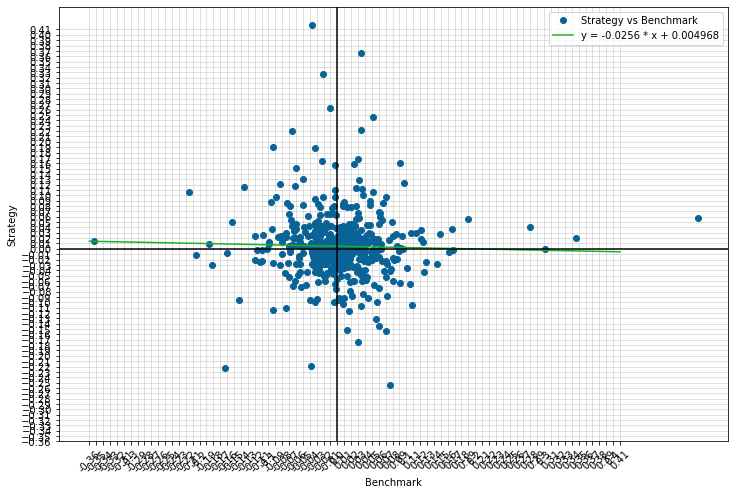

sigma: 0.0635
relsig: 0.9861
sharpe: 1.7427
sharpe-bm: 0.9913
eqn: y = -0.0256 * x + 0.004968
alpha: 0.004968
cumalpha: 12.6633
beta: -0.0256
corr: -0.026
p-value: 0.5582
beta-stderr: 0.0437


In [322]:
capmdict_ovn = stratcapm(dfstrat_ovn, startstr, endstr, bmprefix='hld1', plot=True)
for key, value in capmdict_ovn.items():
    print(f'{key}: {value}')

### Single parameter NA-sharpe optimization 

In [323]:
numdaymin = 3
numdaymax = 22
numdayrange = range(numdaymin, numdaymax)

dfparams = pd.DataFrame(columns=numdayrange)
for numday in numdayrange:
    dfstrat = strat_shppair(corelist, dfohlc, numday=numday, trademode='ovn', lev=1.0)
    dfkpi = gettrackkpi(dfstrat, 'dir1')
    displayfield = ['win%', 'odds', 'profitfactor', 'totalpct', 'MDD', 'calmar', 'NAsharpe']
    for field in displayfield:
        dfparams.loc[field, numday] = dfkpi.loc[field, 'ALL']
        
dfparams = dfparams.transpose()

C:\Kit\Python\Envs\TMBA\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Kit\Python\Envs\TMBA\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Kit\Python\Envs\TMBA\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

In [324]:
dfparams.sort_values('NAsharpe', ascending=False)

,win%,odds,profitfactor,totalpct,MDD,calmar,NAsharpe
21,50.51,1.37908,1.4075,28.1153,-0.474641,5.011,2.3832
20,50,1.37938,1.37938,23.6598,-0.476721,4.7311,2.2489
6,50.59,1.3211,1.35265,21.4971,-0.528151,4.141,2.1432
4,52.56,1.21742,1.34882,21.169,-0.653785,3.3285,2.1157
19,49.49,1.3586,1.33116,16.908,-0.549632,3.6677,2.005
16,50.81,1.28127,1.32347,16.7644,-0.464539,4.3265,1.9692
14,50.6,1.28957,1.32089,16.5696,-0.43049,4.6493,1.9606
7,50.5,1.28745,1.31346,15.9461,-0.607015,3.2522,1.9341
15,50.5,1.28617,1.31215,15.5152,-0.489608,3.9922,1.914
9,50.1,1.29481,1.3,14.3351,-0.555665,3.4161,1.8595


### Adjust to optimal `numday` parameter with 

In [325]:
dfstrat_ovnopt = strat_shppair(corelist, dfohlc, numday=12, trademode='ovn', lev=1.0)
dfkpi_ovnopt = gettrackkpi(dfstrat_ovnopt, 'dir1')
dfkpi_ovnopt

C:\Kit\Python\Envs\TMBA\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Kit\Python\Envs\TMBA\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Kit\Python\Envs\TMBA\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

,ALL,LONG,SHORT
count,500,279,221
avgpct,0.00520074,0.00520043,0.00520114
stdpct,0.0641468,0.061515,0.0674643
win%,50.8,55.2,45.25
winpct,0.0452251,0.0404833,0.0525275
losspct,-0.0361252,-0.0382681,-0.0339116
odds,1.2519,1.05789,1.54896
profitfactor,1.29261,1.30347,1.28019
skewness,1.26014,0.423247,2.05444
kurtosis,8.26368,6.70483,9.44955


### Equity curve of optimal parameter

In [326]:
ploteq(dfstrat_ovnopt, f'{corelist[0]}/{corelist[1]} SHP-pair-trading with optimal parameter', bmfield='hld1')

### Strategy Alpha

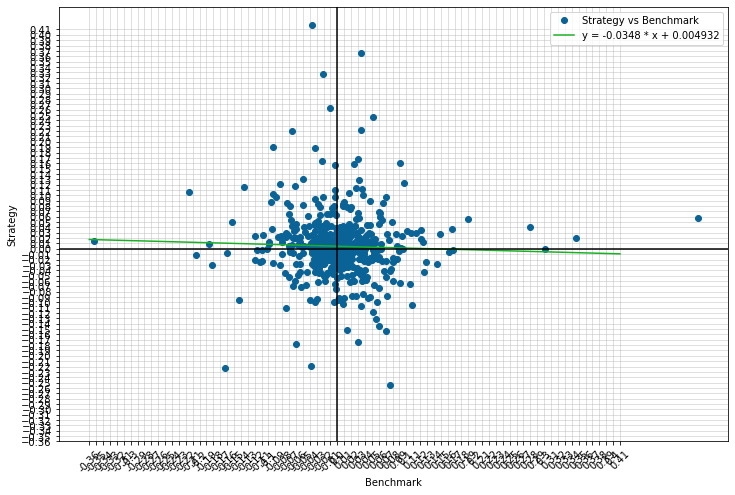

sigma: 0.0636
relsig: 0.988
sharpe: 1.7174
sharpe-bm: 0.9913
eqn: y = -0.0348 * x + 0.004932
alpha: 0.004932
cumalpha: 12.4348
beta: -0.0348
corr: -0.0352
p-value: 0.4271
beta-stderr: 0.0438


In [327]:
capmdict_ovnopt = stratcapm(dfstrat_ovnopt, startstr, endstr, bmprefix='hld1', plot=True)
for key, value in capmdict_ovnopt.items():
    print(f'{key}: {value}')

### Resample to weekly dataframe and check CAPM

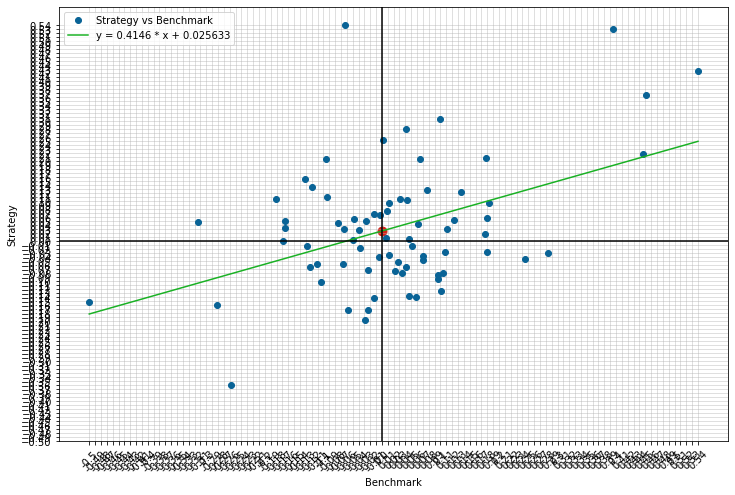

sigma: 0.1578
relsig: 0.9495
sharpe: 1.8484
sharpe-bm: 1.0336
eqn: y = 0.4146 * x + 0.025633
alpha: 0.025633
cumalpha: 6.6647
beta: 0.4146
corr: 0.4367
p-value: 0.0001
beta-stderr: 0.1007


In [328]:
# Resample to monthly
aggrule = {'hld1pct': 'sum', 'betpct': 'sum'}
dfstrat_ovnopt_weekly = dfstrat_ovnopt.resample('W', closed='left').agg(aggrule)

# CAPM
capmdict_ovnopt_weekly = stratcapm(dfstrat_ovnopt_weekly, startstr, endstr, bmprefix='hld1', shiftbin=0, plot=True)
for key, value in capmdict_ovnopt_weekly.items():
    print(f'{key}: {value}')